

# 5. Segmentación por color 

Se implementó un proceso integral de segmentación de objetos por color en imágenes digitales, fundamentado en los principios de procesamiento de imágenes descritos por Gonzalez y Woods (2018) y Bradski y Kaehler (2008). El flujo de trabajo se desarrolló en Python, utilizando los espacios de color HSV y Lab, junto con operaciones morfológicas, transformadas y gradientes que optimizaron la precisión en la detección. La metodología combinó filtrado Gaussiano, detección de bordes mediante los operadores Sobel y Canny, la transformada de distancia y el algoritmo Watershed para la separación de objetos adyacentes. Además, se aplicaron operaciones de apertura, cierre y dilatación para reducir el ruido y mejorar la continuidad de las regiones segmentadas.


#### Configuración de librerías y rutas

En esta sección se importan las librerías necesarias para el procesamiento y segmentación de imágenes, y se definen las rutas de entrada y salida. También se crea el directorio de
salida donde se guardarán los resultados generados (máscaras, imágenes segmentadas y reportes).

In [1]:

# === Librerías y rutas ===
import os, glob
from typing import Dict, Tuple, List, Optional
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown

# (Opcional) para visualizar dentro del notebook
%matplotlib inline

# Rutas (reproducibles)
INPUT_DIR = 'input'      # carpeta con imágenes
OUTPUT_DIR = 'output'    # resultados: máscaras, overlays, CSVs
os.makedirs(OUTPUT_DIR, exist_ok=True)

print('Rutas listas:')
print('  INPUT_DIR =', os.path.abspath(INPUT_DIR))
print('  OUTPUT_DIR=', os.path.abspath(OUTPUT_DIR))


Rutas listas:
  INPUT_DIR = c:\Users\sebastiang\Documents\GitHub\Trabajo_01_Quartz_Meditativo\Segmentacion\input
  OUTPUT_DIR= c:\Users\sebastiang\Documents\GitHub\Trabajo_01_Quartz_Meditativo\Segmentacion\output


#### Parámetros globales

Este bloque define las `constantes` y `parámetros base` que controlan los principales procesos de segmentación y filtrado en el análisis de imágenes.  
Se incluyen los tamaños de los `kernels morfológicos`, el `umbral de gradiente` para detección de bordes y los `rangos fijos` usados para identificar colores o materiales específicos. 

Estos valores actúan como configuraciones universales del módulo: afectan a todas las funciones que procesan máscaras, suavizan imágenes o eliminan ruido.  
Al centralizarlos, se facilita la calibración de los resultados según las condiciones de iluminación o las características del entorno.


In [2]:
# =====================
# Parámetros globales
# =====================
# Estos valores controlan suavizado, operaciones morfológicas y umbrales.
_K_BLUR = (5, 5)
_K_OPEN_3 = np.ones((3, 3), np.uint8)
_K_OPEN_5 = np.ones((5, 5), np.uint8)
_K_CLOSE_5 = np.ones((5, 5), np.uint8)
_K_CLOSE_7 = np.ones((7, 7), np.uint8)
_K_DIL_3 = np.ones((3, 3), np.uint8)
_G_THRESH = 16.0

# Rangos fijos usados en la detección
_WHITE_CORE_LO = (0, 0, 205)
_WHITE_CORE_HI = (179, 35, 255)
_WOOD_LO, _WOOD_HI = (12, 80, 60), (24, 180, 200)
_DARK_GRAY_LO, _DARK_GRAY_HI = (0, 0, 25), (179, 60, 180)


#### Configuración de rangos HSV por escena

Este bloque define un diccionario llamado `HSV_RANGES` que contiene los **rangos de color en el espacio HSV (Hue, Saturation, Value)**.  
Cada **escena** (por ejemplo, `'office'`) tiene un conjunto de **colores o materiales** asociados, y cada uno se define mediante dos tuplas:  
- **Límite inferior**: valores mínimos de tono, saturación y brillo.  
- **Límite superior**: valores máximos de tono, saturación y brillo.  

Por ejemplo, en `'green_lime': ((30, 80, 80), (70, 255, 255))`, se detectan píxeles con tonos de verde entre 30 y 70, saturación entre 80 y 255, y brillo entre 80 y 255.

In [3]:

HSV_RANGES: Dict[str, Dict[str, Tuple[Tuple[int,int,int], Tuple[int,int,int]]]] = {
    'office': {
        'green_lime': ((30, 80, 80),  (70, 255, 255)),
        'yellow':     ((22, 140, 160), (33, 255, 255)),
        'white':      ((0, 0, 205), (179, 25, 255)),
        'wood':       ((10, 70, 60), (25, 180, 170)),
        'dark_gray':  ((0,0,30),      (179,60,120)),
        'black':      ((0, 15, 0),    (179, 255, 70)),
    }
}
print('Rangos de colores identificados para los objetos en la imagen')


Rangos de colores identificados para los objetos en la imagen


### Funciones para lectura, conversión y segmentación

En este bloque se implementan las funciones base del flujo: lectura de imagen, conversión de espacio de color, creación/limpieza de máscaras y utilidades de segmentación por clases específicas.

- `read_rgb(path)`  
  Lee una imagen en formato BGR (por defecto en OpenCV) y la convierte a `RGB` para visualización y procesamiento consistente. Lanza `FileNotFoundError` si la ruta no es válida.

- `rgb_to_hsv(img_rgb)`  
  Convierte de `RGB` a `HSV` (Hue, Saturation, Value). Este espacio separa cromaticidad de luminancia y suele ser más robusto para segmentar por color bajo cambios moderados de iluminación.

- `make_mask_hsv(img_rgb, hmin, smin, vmin, hmax, smax, vmax)`  
  Genera una **máscara binaria** usando `cv2.inRange` sobre la imagen en `HSV`.  
  Útil para aislar objetos cuyo color cae dentro de un rango específico (`[lo, hi]`).

- `morphology_clean(mask, ksize=3, open_it=1, close_it=1, dilate_it=0, erode_it=0)`  
  Aplica operaciones morfológicas para **reducir ruido** y **cerrar huecos**:
  `OPEN` (elimina ruido fino), `CLOSE` (sella agujeros), `DILATE`/`ERODE` (ajuste de bordes).  
  El parámetro `ksize` controla el tamaño del kernel cuadrado `ksize×ksize`.

---

### Funciones especiales de apoyo a la segmentación

Estas funciones combinan operaciones de filtrado, morfología y análisis de contornos para generar **máscaras auxiliares** y refinar clases de color específicas dentro de la imagen (blanco, madera, gris oscuro y negro).

- `build_aux_masks(img_rgb, hsv, scene_ranges)`  
  Crea máscaras auxiliares para materiales o zonas específicas:
  - `wood_mask_aux`: áreas con tonos de madera.  
  - `laptop_mask_aux`: zonas gris oscuro  
  - `white_core_aux`: núcleos blancos muy brillantes.  
  Devuelve estas máscaras junto con los canales `H`, `S` y `V`.

- `handle_white(...)`  
  Genera la máscara final de **zonas blancas**, combinando los núcleos brillantes y sus áreas adyacentes, excluyendo regiones de madera.

- `handle_yellow(...)`  
  Ajusta el rango del color **amarillo** a un intervalo cromático más preciso, eliminando valores con `H ≥ 36` para evitar confusiones con tonos anaranjados.

- `handle_wood(...)`  
  Conserva únicamente el **objeto de madera** más grande detectado.

- `handle_dark_gray(...)`  
  Refina la detección de zonas **gris oscuro**, ampliando suavemente los bordes y seleccionando el contorno principal.

- `handle_black_family(...)`  
  Detecta y limpia las zonas **negras** (mate o brillantes).

Estas funciones permiten un control más fino de la segmentación y garantizan que cada clase de color se detecte con mayor precisión y sin solapamientos.

In [4]:
# === Funciones principales ===

def read_rgb(path: str) -> np.ndarray:
    """Lee imagen BGR con OpenCV y la convierte a RGB (para matplotlib)."""
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f'No pude leer: {path}')
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def rgb_to_hsv(img_rgb: np.ndarray) -> np.ndarray:
    """Convierte RGB -> HSV (más robusto para segmentar por color)."""
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

def make_mask_hsv(img_rgb: np.ndarray, hmin: int, smin: int, vmin: int,
                  hmax: int, smax: int, vmax: int) -> np.ndarray:
    """Crea máscara binaria en HSV con inRange."""
    hsv = rgb_to_hsv(img_rgb)
    lower = np.array([hmin, smin, vmin], dtype=np.uint8)
    upper = np.array([hmax, smax, vmax], dtype=np.uint8)
    return cv2.inRange(hsv, lower, upper)

def morphology_clean(mask: np.ndarray, ksize=3, open_it=1, close_it=1, dilate_it=0, erode_it=0) -> np.ndarray:
    """Limpieza morfológica: abre/cierra/dilata/erode."""
    kernel = np.ones((ksize, ksize), np.uint8)
    m = mask.copy()
    if open_it>0:
        m = cv2.morphologyEx(m, cv2.MORPH_OPEN, kernel, iterations=open_it)
    if close_it>0:
        m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, kernel, iterations=close_it)
    if dilate_it>0:
        m = cv2.dilate(m, kernel, iterations=dilate_it)
    if erode_it>0:
        m = cv2.erode(m, kernel, iterations=erode_it)
    return m


def build_aux_masks(img_rgb: np.ndarray, hsv: np.ndarray, scene_ranges: Dict[str, Tuple[Tuple[int,int,int], Tuple[int,int,int]]]):
    """
    Crea tres máscaras auxiliares:
      - wood_mask_aux: zonas con color madera.
      - laptop_mask_aux: zonas gris oscuro (como un portátil).
      - white_core_aux: áreas blancas muy brillantes.
    Además, devuelve los canales HSV separados (H, S, V).
    """
    H, S, V = hsv[:, :, 0], hsv[:, :, 1], hsv[:, :, 2]

    wood_mask_aux = None
    if 'wood' in scene_ranges:
        hsv_w = _rgb_to_hsv_blur(img_rgb)
        wood_raw = _range_mask(hsv_w, _WOOD_LO, _WOOD_HI)
        wood_raw = cv2.morphologyEx(wood_raw, cv2.MORPH_OPEN, _K_OPEN_3, 1)
        wood_raw = cv2.morphologyEx(wood_raw, cv2.MORPH_CLOSE, _K_CLOSE_7, 1)
        wood_mask_aux = wood_raw

    laptop_mask_aux = None
    if 'dark_gray' in scene_ranges:
        hsv_g = _rgb_to_hsv_blur(img_rgb)
        lap = _range_mask(hsv_g, _DARK_GRAY_LO, _DARK_GRAY_HI)
        lap = cv2.morphologyEx(lap, cv2.MORPH_CLOSE, _K_CLOSE_5, 1)
        cnts, _ = cv2.findContours(lap, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if cnts:
            laptop_mask_aux = np.zeros_like(lap)
            cv2.drawContours(laptop_mask_aux, [max(cnts, key=cv2.contourArea)], -1, 255, cv2.FILLED)

    white_core_aux = _range_mask(hsv, _WHITE_CORE_LO, _WHITE_CORE_HI)
    return wood_mask_aux, laptop_mask_aux, white_core_aux, H, S, V


def handle_white(img_rgb, hsv, H, S, V, base_mask, white_core_aux, wood_mask_aux):
    """
    Detecta las zonas blancas y las superficies que las rodean.
    Combina componentes en contacto con el núcleo y las áreas blancas compactas.
    """
    core = white_core_aux.copy()
    relax = make_mask_hsv(img_rgb, 0, 0, 160, 179, 60, 255)
    if wood_mask_aux is not None:
        relax = cv2.bitwise_and(relax, cv2.bitwise_not(wood_mask_aux))
    mask_sheet = _components_touching_core(relax, core)
    mask_core = np.zeros_like(core)
    cnts, _ = cv2.findContours(core, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in cnts:
        if cv2.contourArea(c) >= 100:
            cv2.drawContours(mask_core, [c], -1, 255, cv2.FILLED)
    return cv2.bitwise_or(mask_sheet, mask_core)


def handle_yellow(img_rgb, H, base_lo, base_hi):
    """
    Crea una máscara para tonos amarillos, restringida a un rango cromático más preciso.
    Excluye valores con matiz (H) superior a 36.
    """
    lo_y = (max(22, base_lo[0]), max(140, base_lo[1]), max(160, base_lo[2]))
    hi_y = (min(33, base_hi[0]), base_hi[1], base_hi[2])
    mask = make_mask_hsv(img_rgb, lo_y[0], lo_y[1], lo_y[2], hi_y[0], hi_y[1], hi_y[2])
    mask[H >= 36] = 0
    return mask


def handle_wood(wood_mask_aux: Optional[np.ndarray]) -> Optional[np.ndarray]:
    """Limpia la máscara de madera conservando solo el objeto más grande."""
    if wood_mask_aux is None:
        return None
    return _largest_external_contour_mask(wood_mask_aux)


def handle_dark_gray(laptop_mask_aux: Optional[np.ndarray]) -> Optional[np.ndarray]:
    """Refina la detección de zonas grises oscuras ampliando suavemente sus bordes."""
    if laptop_mask_aux is None:
        return None
    m = laptop_mask_aux.copy()
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN, _K_OPEN_3, 1)
    m = cv2.dilate(m, _K_DIL_3, 2)
    return _largest_external_contour_mask(m)


def handle_black_family(img_rgb, hsv, H, S, V, scene_ranges, white_core_aux, wood_mask_aux, laptop_mask_aux):
    """
    Detecta y limpia objetos negros (mate o brillantes).
    Aplica filtros para eliminar sombras y excluir otras superficies como madera o blanco.
    """
    if 'black_matte' in scene_ranges and 'black_shiny' in scene_ranges:
        lo_m, hi_m = scene_ranges['black_matte']
        lo_s, hi_s = scene_ranges['black_shiny']
        m1 = make_mask_hsv(img_rgb, lo_m[0], lo_m[1], lo_m[2], hi_m[0], hi_m[1], hi_m[2])
        m2 = make_mask_hsv(img_rgb, lo_s[0], lo_s[1], lo_s[2], hi_s[0], hi_s[1], hi_s[2])
        mask = cv2.bitwise_or(m1, m2)
    else:
        lo_b, hi_b = scene_ranges.get('black', ((0, 15, 0), (179, 255, 70)))
        mask = make_mask_hsv(img_rgb, lo_b[0], lo_b[1], lo_b[2], hi_b[0], hi_b[1], hi_b[2])

    dark_ref = (((V < 135) & (S > 10)).astype(np.uint8)) * 255
    mask = cv2.bitwise_or(mask, dark_ref)

    if wood_mask_aux is not None:
        mask = cv2.bitwise_and(mask, cv2.bitwise_not(wood_mask_aux))
    if laptop_mask_aux is not None:
        mask = cv2.bitwise_and(mask, cv2.bitwise_not(laptop_mask_aux))
    mask = cv2.bitwise_and(mask, cv2.bitwise_not(white_core_aux))

    blur_v = cv2.GaussianBlur(V, _K_BLUR, 0)
    gx_v = cv2.Sobel(blur_v, cv2.CV_32F, 1, 0, ksize=3)
    gy_v = cv2.Sobel(blur_v, cv2.CV_32F, 0, 1, ksize=3)
    grad_v = cv2.magnitude(gx_v, gy_v)

    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    L = lab[:, :, 0].astype(np.uint8)
    grad_L = _gradient_mag(L)

    shadow_like = (((V < 105) & (S < 28)) & ((grad_v < _G_THRESH) & (grad_L < _G_THRESH))).astype(np.uint8) * 255
    shadow_like = cv2.dilate(shadow_like, _K_CLOSE_5, 1)
    mask = cv2.bitwise_and(mask, cv2.bitwise_not(shadow_like))

    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, _K_CLOSE_5)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, _K_OPEN_3)

    Hh, Ww = mask.shape
    min_a, max_a = 800, 0.08 * Hh * Ww
    return _select_components_by_area_and_border(mask, min_a, max_a, keep_top=3)

print('Funciones principales listas')

Funciones principales listas


#### Funciones auxiliares

En esta sección se definen funciones complementarias para el **refinamiento de máscaras**, la **separación de objetos** y la **extracción y visualización de contornos**.  
Estas herramientas permiten mejorar la precisión de la segmentación y obtener métricas como el área de cada objeto identificado.  

- `refine_with_edges(img_rgb, mask, low, high, use_edges)`  
  Aplica el detector de bordes de *Canny* sobre la imagen en escala de grises, seguido de un **cierre morfológico**.  
  Combina los bordes detectados con la máscara original para refinar los límites de los objetos segmentados.  
  Devuelve la **máscara refinada** y la imagen de bordes.

- `split_touching_objects(mask)`  
  Utiliza la **transformada de distancia** y el algoritmo **Watershed** para separar objetos que están pegados o solapados en la máscara, mejorando el conteo individual de elementos en la escena.

- `contours_and_areas(mask)`  
  Encuentra los **contornos externos** de los objetos presentes en la máscara y calcula su área.  
  Devuelve las listas de **contornos** y **áreas** correspondientes, conservando el mismo orden.

- `draw_numbered_contours_on(img_rgb, contours)`  
  Dibuja los contornos sobre la imagen original y numera cada objeto en su centroide.  
  Facilita la **verificación visual** de la segmentación y la **identificación** de cada elemento.

In [5]:
# === Funciones auxiliares ===
def refine_with_edges(img_rgb: np.ndarray, mask: np.ndarray, low=120, high=240, use_edges=True):
    """Refinamiento con Canny + cierre, luego unión con máscara. Devuelve (refinado, edges)."""
    if not use_edges:
        return mask, np.zeros_like(mask)

    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    gray = cv2.GaussianBlur(gray, (5,5), 1.2)
    edges = cv2.Canny(gray, threshold1=low, threshold2=high)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, np.ones((3,3), np.uint8), iterations=1)
    refined = cv2.bitwise_and(mask, mask, mask=(edges>0).astype(np.uint8)*255)
    refined = cv2.bitwise_or(refined, mask)
    return refined, edges

def split_touching_objects(mask: np.ndarray) -> np.ndarray:
    """Separa objetos pegados usando distance transform + watershed."""
    bin2 = (mask>0).astype(np.uint8)*255
    dist = cv2.distanceTransform(bin2, cv2.DIST_L2, 5)

    _, sure_fg = cv2.threshold(dist, 0.4*dist.max(), 255, 0)
    sure_fg = sure_fg.astype(np.uint8)

    sure_bg = cv2.dilate(bin2, np.ones((3,3), np.uint8), iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    num, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown==255] = 0

    fake_rgb = cv2.cvtColor(bin2, cv2.COLOR_GRAY2BGR)
    cv2.watershed(fake_rgb, markers)

    separated = np.where(markers>1, 255, 0).astype(np.uint8)
    return separated

def contours_and_areas(mask: np.ndarray):
    """Encuentra contornos externos y devuelve sus áreas (mismo modo y orden)."""
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in contours]
    return contours, areas

def draw_numbered_contours_on(img_rgb: np.ndarray, contours: List[np.ndarray], color=(0,255,0)) -> np.ndarray:
    """Dibuja contornos y numera cada uno en su centroide (mismo estilo y grosor)."""
    out = img_rgb.copy()
    bgr = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)
    cv2.drawContours(bgr, contours, -1, color, 2)

    font = cv2.FONT_HERSHEY_SIMPLEX
    scale = 0.6
    thickness = 2

    for idx, c in enumerate(contours, start=1):
        M = cv2.moments(c)
        if M["m00"] == 0:
            continue
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
        label = str(idx)
        cv2.putText(bgr, label, (cx, cy), font, scale, (0,0,0), thickness+2, cv2.LINE_AA)
        cv2.putText(bgr, label, (cx, cy), font, scale, (255,255,255), thickness, cv2.LINE_AA)

    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
def _rgb_to_hsv_blur(img_rgb: np.ndarray, ksize=_K_BLUR) -> np.ndarray:
    """Convierte una imagen RGB a HSV aplicando suavizado para reducir ruido."""
    return cv2.cvtColor(cv2.GaussianBlur(img_rgb, ksize, 0), cv2.COLOR_RGB2HSV)

def _range_mask(hsv: np.ndarray, lo: Tuple[int,int,int], hi: Tuple[int,int,int]) -> np.ndarray:
    """Crea una máscara binaria que selecciona los píxeles dentro del rango HSV indicado."""
    return cv2.inRange(hsv, np.array(lo, np.uint8), np.array(hi, np.uint8))

def _largest_external_contour_mask(mask: np.ndarray) -> np.ndarray:
    """Conserva solo el contorno externo más grande de una máscara."""
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    out = np.zeros_like(mask)
    if cnts:
        cv2.drawContours(out, [max(cnts, key=cv2.contourArea)], -1, 255, cv2.FILLED)
    return out

def _gradient_mag(gray_u8: np.ndarray) -> np.ndarray:
    """Calcula la magnitud del gradiente de una imagen en escala de grises."""
    g = cv2.GaussianBlur(gray_u8, _K_BLUR, 0)
    gx = cv2.Sobel(g, cv2.CV_32F, 1, 0, ksize=3)
    gy = cv2.Sobel(g, cv2.CV_32F, 0, 1, ksize=3)
    return cv2.magnitude(gx, gy)

def _select_components_by_area_and_border(mask: np.ndarray, min_area: int, max_area: float, keep_top: int = 3) -> np.ndarray:
    """Filtra los objetos según su tamaño y posición, conservando los más grandes dentro de límites válidos."""
    h, w = mask.shape
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    valid = []
    for c in cnts:
        a = cv2.contourArea(c)
        if a < min_area or a > max_area:
            continue
        x, y, ww, hh = cv2.boundingRect(c)
        if x <= 0 or y <= 0 or (x + ww) >= w - 1 or (y + hh) >= h - 1:
            continue
        valid.append((a, c))
    valid.sort(key=lambda t: t[0], reverse=True)
    out = np.zeros_like(mask)
    for _, c in valid[:keep_top]:
        cv2.drawContours(out, [c], -1, 255, cv2.FILLED)
    return out

def _components_touching_core(relax_mask: np.ndarray, core_mask: np.ndarray) -> np.ndarray:
    """Identifica los objetos de una máscara que están en contacto con otra (núcleo blanco)."""
    num, labels = cv2.connectedComponents(relax_mask)
    out = np.zeros_like(relax_mask)
    for lab in range(1, num):
        comp = (labels == lab)
        if (core_mask[comp] > 0).any():
            out[comp] = 255
    return out

def make_mask_hsv(img_rgb: np.ndarray, h_lo: int, s_lo: int, v_lo: int, h_hi: int, s_hi: int, v_hi: int) -> np.ndarray:
    """Genera una máscara HSV a partir de los límites indicados (usada por todas las funciones principales)."""
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    return _range_mask(hsv, (h_lo, s_lo, v_lo), (h_hi, s_hi, v_hi))

print('Funciones auxiliares listas')

Funciones auxiliares listas



#### Función especial

La función `process_scene_color()` coordina el procesamiento completo de un color específico dentro de una escena, aplicando distintas reglas según su tipo (blanco, amarillo, madera, gris oscuro, negro, etc.). Integra las funciones auxiliares y especiales para generar máscaras limpias, refinadas y sin solapamientos entre clases.

In [6]:

def process_scene_color(img_rgb: np.ndarray,
                        hsv: np.ndarray,
                        color_name: str,
                        lo: Tuple[int,int,int],
                        hi: Tuple[int,int,int],
                        scene_ranges,
                        aux,
                        processed_black_flag: bool):
    """
    Procesa un color respetando las ramas condicionales 
    Devuelve: (color_name_posiblemente_modificado, mask_split, edges, mask_clean, skip_flag, processed_black_flag)
    """
    wood_mask_aux, laptop_mask_aux, white_core_aux, H, S, V = aux

    # (1) Estás máscaras son auxiliares 
    SKIP_COLORS = {'wood', 'black', 'black_matte', 'black_shiny'}
    if color_name in SKIP_COLORS:
        return color_name, None, None, None, True, processed_black_flag

    # Máscara base
    mask = make_mask_hsv(img_rgb, lo[0], lo[1], lo[2], hi[0], hi[1], hi[2])

    # Casos especiales 
    if color_name == 'white':
        mask = handle_white(img_rgb, hsv, H, S, V, mask, white_core_aux, wood_mask_aux)
    elif color_name == 'yellow':
        mask = handle_yellow(img_rgb, H, lo, hi)
    elif color_name == 'wood':
        # No se llega aquí porque wood está en SKIP_COLORS (auxiliar arriba).
        pass
    elif color_name == 'dark_gray':
        mg = handle_dark_gray(laptop_mask_aux)
        if mg is not None:
            mask = mg
    elif (not processed_black_flag) and          ('black_matte' in scene_ranges and 'black_shiny' in scene_ranges) and          color_name in ('black_matte', 'black_shiny'):
        # Unión y refinamientos de negros (se hace UNA vez y se renombra a 'black')
        mask = handle_black_family(img_rgb, hsv, H, S, V, scene_ranges, white_core_aux, wood_mask_aux, laptop_mask_aux)
        color_name = 'black'
        processed_black_flag = True

    # (1.b) Salto si la máscara quedó casi vacía
    if mask is None or int(mask.sum()) < 255 * 50:
        return color_name, None, None, None, True, processed_black_flag

    # (2) Limpieza morfológica general (idéntica)
    if color_name in ('white', 'yellow'):
        mask_clean = morphology_clean(mask, ksize=5, open_it=1, close_it=2)
        if color_name == 'white':
            mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_CLOSE, np.ones((15,15), np.uint8))
            mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_OPEN,  np.ones((3,3),  np.uint8))
    else:
        mask_clean = morphology_clean(mask, ksize=3, open_it=1, close_it=1)

    # (3) Refinamiento / separación
    if color_name in ('white','yellow','wood','dark_gray','black'):
        edges = np.zeros_like(mask_clean)
        mask_split = mask_clean.copy()
    else:
        mask_refined, edges = refine_with_edges(img_rgb, mask_clean, low=120, high=240)
        mask_split = split_touching_objects(mask_refined)

    # (4) Filtro final (evita reflejos inferiores en blancos)
    cnts, _ = cv2.findContours(mask_split, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    h_img, w_img = mask_split.shape
    MIN_AREA, BOTTOM_FRAC = 2000, 0.75

    contours = []
    for c in cnts:
        if cv2.contourArea(c) < MIN_AREA:
            continue
        x, y, cw, ch = cv2.boundingRect(c)
        if color_name == 'white' and y > int(h_img * BOTTOM_FRAC):
            continue
        contours.append(c)

    # Generar máscara final 
    mask_out = np.zeros_like(mask_split)
    for c in contours:
        cv2.drawContours(mask_out, [c], -1, 255, cv2.FILLED)

    # edges ya vale ceros para casos especiales
    return color_name, mask_out, edges, mask_clean, False, processed_black_flag


#### Ejecución del flujo principal

Esta función ejecuta todo el proceso de segmentación para una imagen y una escena específicas.  
Lee la imagen, aplica los rangos de color definidos en `HSV_RANGES`, genera máscaras por color, las limpia y separa los objetos detectados.  

In [7]:

def run_pipeline(image_name: str = "office.jpg", scene: str = "office"):
    IMAGE_PATH = os.path.join(INPUT_DIR, image_name)
    if not os.path.exists(IMAGE_PATH):
        raise FileNotFoundError(f"No se encontró la imagen: {IMAGE_PATH}")

    img_bgr = cv2.imread(IMAGE_PATH)
    if img_bgr is None:
        raise FileNotFoundError(f"No se pudo cargar la imagen en {IMAGE_PATH}")
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Escena y rangos
    assert scene in HSV_RANGES, f"{scene} no existe en HSV_RANGES"
    scene_ranges = HSV_RANGES[scene]

    # Pre-cómputos HSV y canales
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    wood_mask_aux, laptop_mask_aux, white_core_aux, H, S, V = build_aux_masks(img, hsv, scene_ranges)
    processed_black = False

    rows = []

    # Bucle 
    for color_name, (lo, hi) in scene_ranges.items():
        print(f"")

        # Procesar color
        cname, mask_split, edges, mask_clean, skipped, processed_black = process_scene_color(
            img, hsv, color_name, lo, hi, scene_ranges,
            aux=(wood_mask_aux, laptop_mask_aux, white_core_aux, H, S, V),
            processed_black_flag=processed_black
        )

        if skipped or mask_split is None:
            print(" ")
            continue

        # Contornos y áreas
        cnts, _ = cv2.findContours(mask_split, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        areas = [cv2.contourArea(c) for c in cnts]

        # Overlay numerado sin reordenar contornos
        overlay = draw_numbered_contours_on(img, cnts, color=(0,255,0))

        # Visualizaciones 
        plt.figure(figsize=(7,5)); plt.imshow(mask_clean, cmap='gray'); plt.axis('off'); plt.title(f'{scene}/{cname}: máscara limpia'); plt.show()
        plt.figure(figsize=(7,5)); plt.imshow(mask_split, cmap='gray'); plt.axis('off'); plt.title(f'{scene}/{cname}: objetos separados'); plt.show()
        plt.figure(figsize=(7,5)); plt.imshow(overlay); plt.axis('off'); plt.title(f'{scene}/{cname}: contornos numerados'); plt.show()

        # Guardado
        base = Path(IMAGE_PATH).stem
        tag  = cname
        cv2.imwrite(os.path.join(OUTPUT_DIR, f"{base}_{tag}_mask.png"),   mask_split)
        cv2.imwrite(os.path.join(OUTPUT_DIR, f"{base}_{tag}_edges.png"),  edges)
        cv2.imwrite(os.path.join(OUTPUT_DIR, f"{base}_{tag}_overlay.png"),
                    cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

        for i, area in enumerate(areas, start=1):
            rows.append({'image': os.path.basename(IMAGE_PATH),
                         'scene': scene, 'color': cname,
                         'object_id': i, 'area_px': int(area)})

    # CSV final
    df = pd.DataFrame(rows)
    csv_path = os.path.join(OUTPUT_DIR, f"{scene}_areas.csv")
    df.to_csv(csv_path, index=False)
    print(f"CSV guardado en: {csv_path}")
    return df

#### Ejecución del pipeline

Este bloque ejecuta la función `run_pipeline()` con la imagen y la escena especificadas (por defecto `"office.jpg"` y `"office"`).  

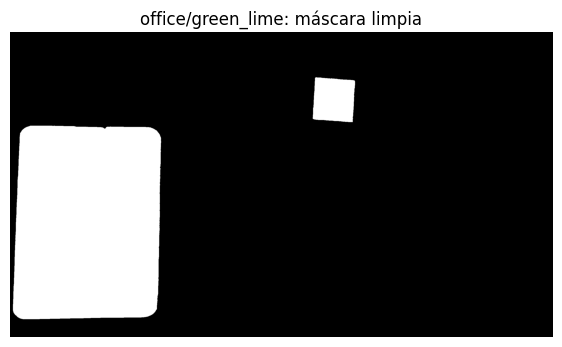

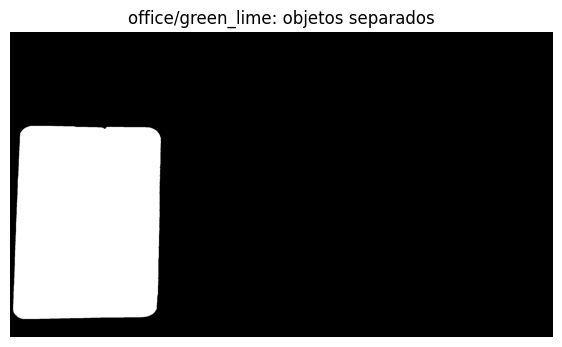

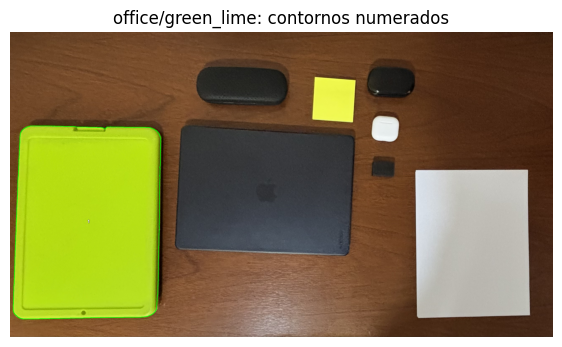

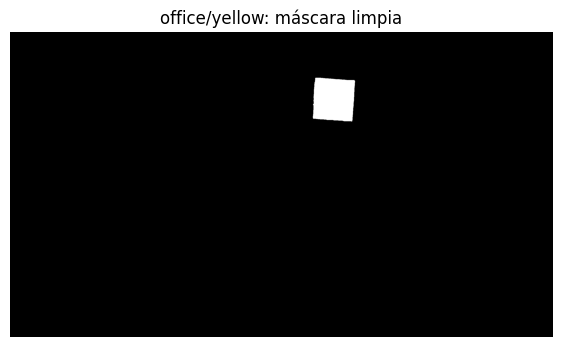

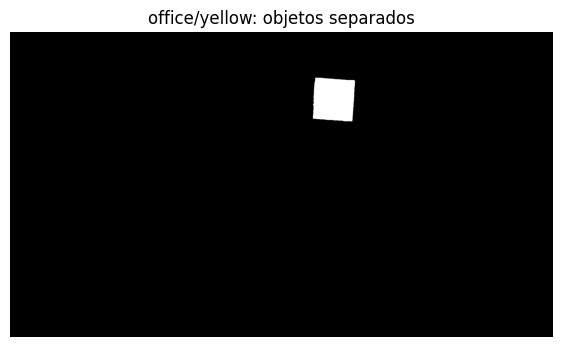

...

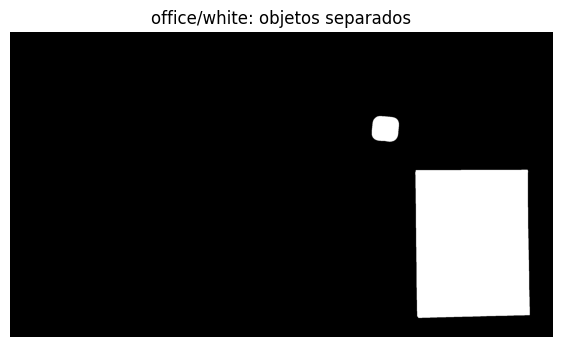

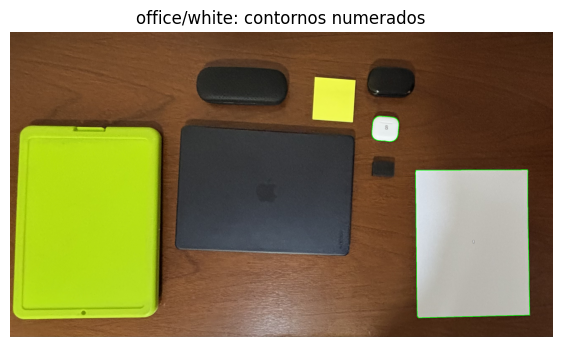

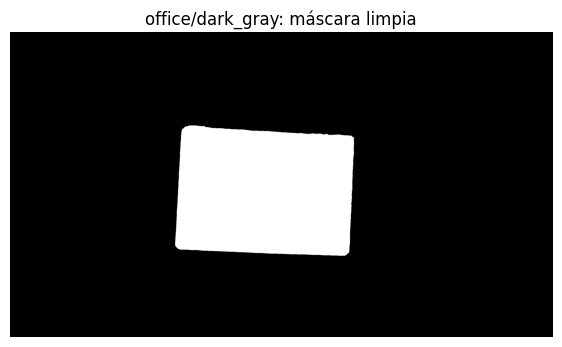

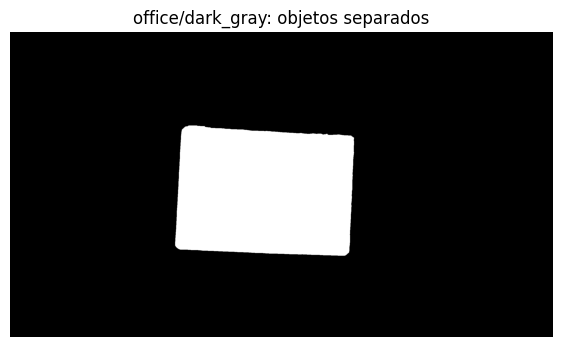

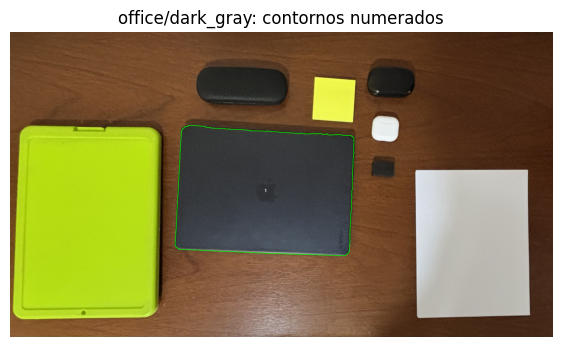


 
CSV guardado en: output\office_areas.csv


,image,scene,color,object_id,area_px
0,office.jpg,office,green_lime,1,619796
1,office.jpg,office,yellow,1,37410
2,office.jpg,office,white,1,375296
3,office.jpg,office,white,2,13643
4,office.jpg,office,dark_gray,1,482528


Procesamiento completado con éxito.


In [8]:

# Ejecuta el pipeline 
try:
    df_result = run_pipeline("office.jpg", "office")
    display(df_result)
    print("Procesamiento completado con éxito." )
except FileNotFoundError as e:
    print(e)


#### Segmentación del color negro 

A continuación se presenta la **segmentación de objetos negros** en la imagen `office.jpg`, combinando los espacios de color `HSV` y `Lab` a fin de evitar considerar las vetas y sombras.

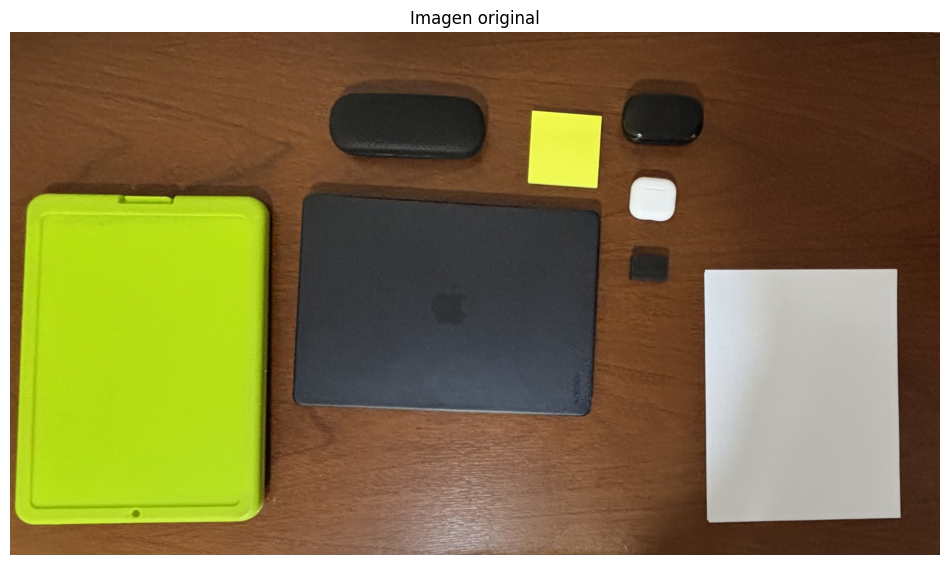

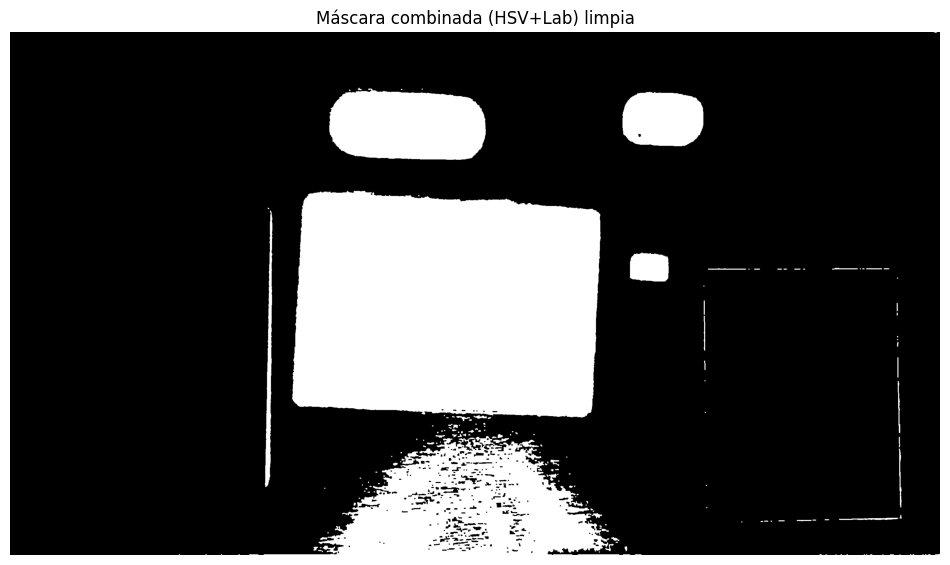

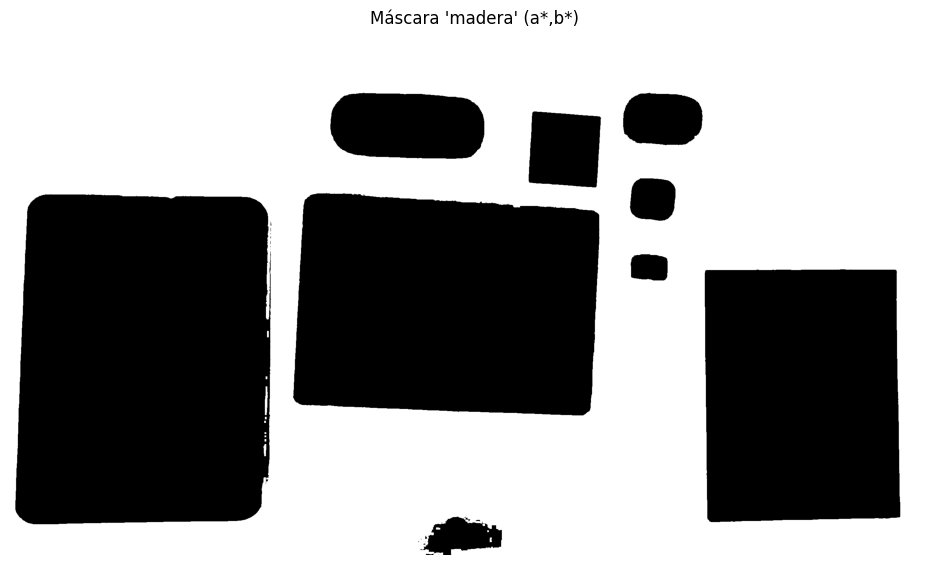

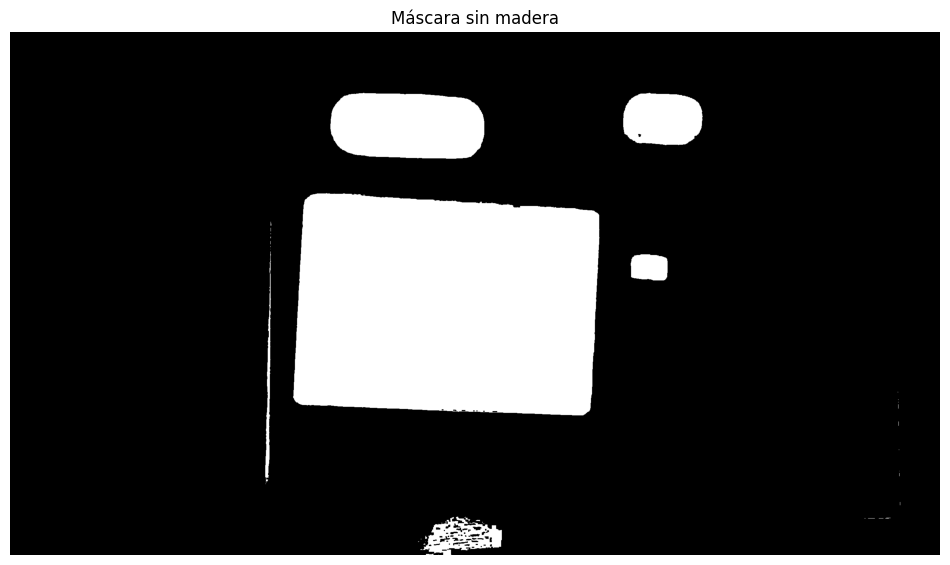

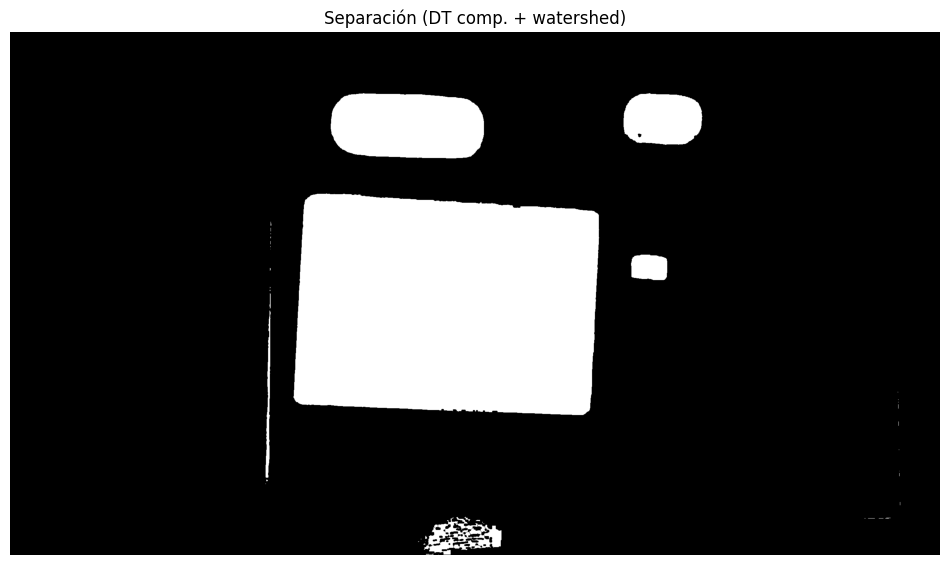

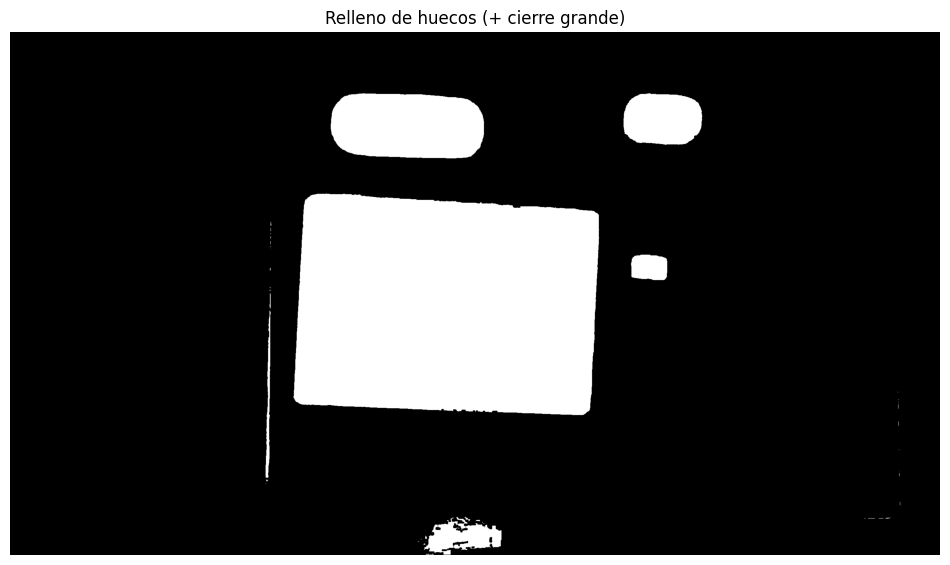

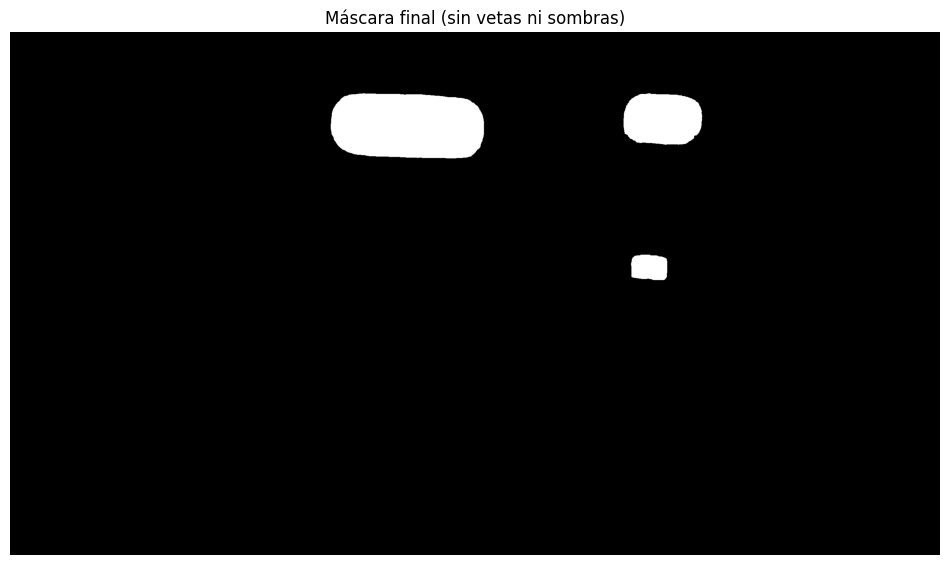

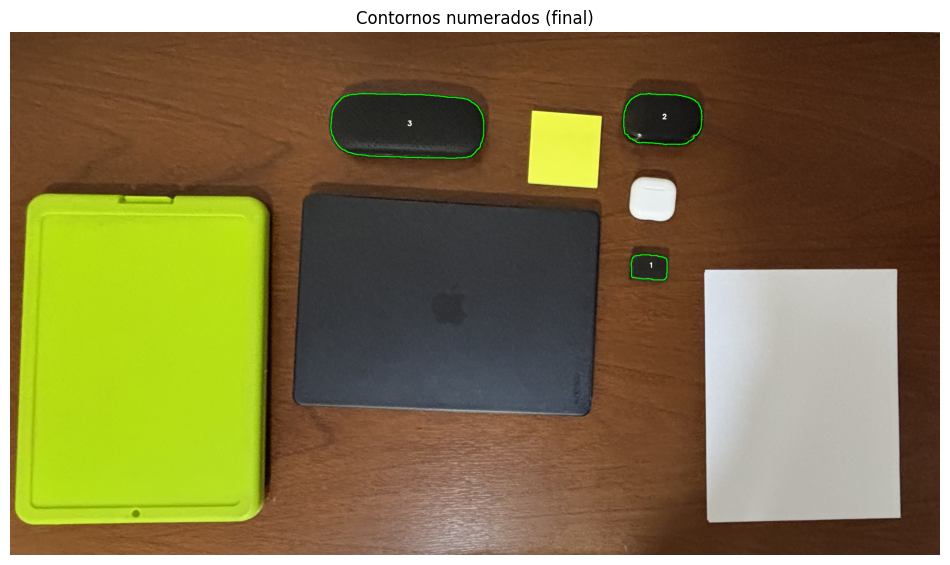

Objetos negros detectados: 3
Resultados en: C:\Users\sebastiang\Documents\GitHub\Trabajo_01_Quartz_Meditativo\Segmentacion\output


In [9]:
# =============================================
# Segmentación de objetos de color negro
# =============================================

# === 1) Configuración ===
image_name = "office.jpg" 
IMAGE_PATH = os.path.join(INPUT_DIR, image_name)
INPUT_PATH = IMAGE_PATH       
OUTPUT_DIR = Path("output"); OUTPUT_DIR.mkdir(exist_ok=True)
scene = "office"
color_name = "black"

# Parámetros (ajustables)
REL_THR = 0.33          # umbral relativo del DT por componente (0.30–0.40)
BG_DILATE_ITER = 1      # dilatación de fondo para watershed
MIN_AREA = 150          # área mínima para contabilizar objetos

# Fondo madera (aprendido en (a*,b*); ignora L para “comerse” sombras)
WOOD_BORDER = 40        # ancho del marco para aprender el color de madera
WOOD_CHI2_AB = 6.5      # umbral Mahalanobis^2 en (a,b) (6.0–7.5 suele ir bien)
WOOD_DILATE_K = 5       # kernel para dilatar la máscara de madera
WOOD_DILATE_IT = 1      # iteraciones de dilatación de madera

# Postprocesado anti-vetas
F_SOL_MIN_AREA = 350    # área mínima tras fill/close
F_SOL_MIN_SOLIDITY = 0.88
F_SOL_BIG_KEEP = 7000   # conserva grandes aunque solidity sea baja

# === 2) Otras funciones ===

def read_rgb(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None: raise FileNotFoundError(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def rgb_to_hsv(img_rgb):
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

def morphology_clean(mask, k=3, open_it=1, close_it=1, dilate_it=0, erode_it=0):
    kernel = np.ones((k, k), np.uint8)
    m = mask.copy()
    if open_it>0:  m = cv2.morphologyEx(m, cv2.MORPH_OPEN, kernel, iterations=open_it)
    if close_it>0: m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, kernel, iterations=close_it)
    if dilate_it>0: m = cv2.dilate(m, kernel, iterations=dilate_it)
    if erode_it>0:  m = cv2.erode(m, kernel, iterations=erode_it)
    return m

def split_touching_objects(mask, rel_thr=REL_THR, bg_dilate_iter=BG_DILATE_ITER):
    bin2 = (mask > 0).astype(np.uint8) * 255
    num_labels, labels = cv2.connectedComponents(bin2)

    sure_fg = np.zeros_like(bin2, dtype=np.uint8)
    for lbl in range(1, num_labels):
        comp = (labels == lbl).astype(np.uint8) * 255
        dist_i = cv2.distanceTransform(comp, cv2.DIST_L2, 5)
        if dist_i.max() <= 0: continue
        thr_i = rel_thr * dist_i.max()
        core_i = (dist_i >= max(1e-6, thr_i)).astype(np.uint8) * 255
        if core_i.max() == 0:
            yx = np.unravel_index(np.argmax(dist_i), dist_i.shape)
            core_i[yx] = 255
        sure_fg = cv2.bitwise_or(sure_fg, core_i)

    kernel = np.ones((3,3), np.uint8)
    sure_bg = cv2.dilate(bin2, kernel, iterations=bg_dilate_iter)
    unknown = cv2.subtract(sure_bg, sure_fg)

    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0

    fake_rgb = cv2.cvtColor(bin2, cv2.COLOR_GRAY2BGR)
    cv2.watershed(fake_rgb, markers)
    separated = np.where(markers > 1, 255, 0).astype(np.uint8)

    # Rescate de componentes perdidas
    for lbl in range(1, num_labels):
        comp = (labels == lbl).astype(np.uint8) * 255
        if cv2.countNonZero(cv2.bitwise_and(comp, separated)) == 0:
            separated = cv2.bitwise_or(separated, comp)
    return separated

def contours_and_areas(mask, min_area=MIN_AREA):
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = [c for c in cnts if cv2.contourArea(c) >= min_area]
    areas = [cv2.contourArea(c) for c in cnts]
    return cnts, areas

def draw_numbered_contours_on(img_rgb, contours):
    out = img_rgb.copy(); bgr = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)
    cv2.drawContours(bgr, contours, -1, (0,255,0), 2)
    for i,c in enumerate(contours, start=1):
        M = cv2.moments(c); 
        if M["m00"] == 0: continue
        cx, cy = int(M["m10"]/M["m00"]), int(M["m01"]/M["m00"])
        cv2.putText(bgr, str(i), (cx,cy), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,0), 3, cv2.LINE_AA)
        cv2.putText(bgr, str(i), (cx,cy), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2, cv2.LINE_AA)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

# --- Fondo madera en (a*,b*) (ignora L ⇒ sombras también son madera) ---
def background_wood_mask_lab_ab(img_rgb, border=WOOD_BORDER, chi2_thr_ab=WOOD_CHI2_AB):
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)
    H, W, _ = lab.shape
    b = int(max(1, min(border, min(H, W)//4)))
    Ab = np.concatenate([
        lab[:b, :, 1:3].reshape(-1,2),
        lab[-b:, :, 1:3].reshape(-1,2),
        lab[:, :b, 1:3].reshape(-1,2),
        lab[:, -b:, 1:3].reshape(-1,2)
    ], axis=0)
    mu = Ab.mean(axis=0)
    cov = np.cov(Ab.T) + np.eye(2, dtype=np.float32)*1e-3
    inv = np.linalg.inv(cov)
    ab = lab[:, :, 1:3]
    diff = ab - mu
    D2 = (diff @ inv * diff).sum(axis=2)
    wood = (D2 < chi2_thr_ab).astype(np.uint8) * 255
    return wood

def fill_external_contours(mask):
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filled = np.zeros_like(mask)
    cv2.drawContours(filled, cnts, -1, 255, thickness=-1)
    return filled

def close_largest_component(mask, k=5, iterations=1):
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts: return mask
    largest = max(cnts, key=cv2.contourArea)
    canvas = np.zeros_like(mask)
    cv2.drawContours(canvas, [largest], -1, 255, thickness=-1)
    kernel = np.ones((k,k), np.uint8)
    closed = cv2.morphologyEx(canvas, cv2.MORPH_CLOSE, kernel, iterations=iterations)
    others = np.zeros_like(mask)
    for c in cnts:
        if c is largest: continue
        cv2.drawContours(others, [c], -1, 255, thickness=-1)
    return cv2.bitwise_or(closed, others)

def filter_by_area_solidity(mask, min_area=F_SOL_MIN_AREA, min_solidity=F_SOL_MIN_SOLIDITY, big_keep_area=F_SOL_BIG_KEEP):
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    out = np.zeros_like(mask); kept = []
    for c in cnts:
        area = cv2.contourArea(c)
        if area < min_area: continue
        hull = cv2.convexHull(c); hull_area = cv2.contourArea(hull) + 1e-6
        solidity = area / hull_area
        if area < big_keep_area and solidity < min_solidity: continue
        cv2.drawContours(out, [c], -1, 255, thickness=-1); kept.append(c)
    return out, kept

# === 3) Imporación de la imagen ===
img_rgb = read_rgb(INPUT_PATH)

# === 4) Máscaras ===
hsv = rgb_to_hsv(img_rgb)
lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB); L, A, B = cv2.split(lab)
mask_hsv = cv2.inRange(hsv, np.array([0, 0, 0]), np.array([179, 120, 160]))
neutral = (cv2.absdiff(A,128) <= 12) & (cv2.absdiff(B,128) <= 12) & (L <= 170)
mask_lab = (neutral.astype(np.uint8) * 255)
mask = cv2.bitwise_or(mask_hsv, mask_lab)
mask_clean = morphology_clean(mask, k=3, open_it=1, close_it=1)

# === 4.1) Quitar color del fondo antes de aplicar el watershed ===
wood = background_wood_mask_lab_ab(img_rgb, border=WOOD_BORDER, chi2_thr_ab=WOOD_CHI2_AB)
if WOOD_DILATE_IT > 0:
    wood = cv2.dilate(wood, np.ones((WOOD_DILATE_K, WOOD_DILATE_K), np.uint8), iterations=WOOD_DILATE_IT)
mask_wo_wood = cv2.bitwise_and(mask_clean, cv2.bitwise_not(wood))

# === 5) SEPARACIÓN (Watershed por componente) ===
mask_sep = split_touching_objects(mask_wo_wood, rel_thr=REL_THR, bg_dilate_iter=BG_DILATE_ITER)

# === 5.1) Relleno de huecos y cierre opcional del componente grande ===
mask_filled = fill_external_contours(mask_sep)
mask_filled = close_largest_component(mask_filled, k=5, iterations=1)

# === 5.2) Filtro por área y 'solidity' (quita vetas) ===
mask_final, kept_contours = filter_by_area_solidity(mask_filled)

def drop_objects_1_and_3(contours, img_shape, bottom_frac=0.12):
    """Elimina: (a) el más grande (#3) y (b) los que caen en la franja inferior (#1)."""
    H, W = img_shape[:2]
    if not contours:
        return []

    # 1) quitar el mayor por área  -> #3
    areas = [cv2.contourArea(c) for c in contours]
    idx_largest = int(np.argmax(areas))
    idx_keep = [i for i in range(len(contours)) if i != idx_largest]

    filtered = []
    y_cut = H * (1 - bottom_frac)  # umbral de franja inferior (ajustable)
    for i in idx_keep:
        c = contours[i]
        M = cv2.moments(c)
        if M["m00"] == 0:
            continue
        cx, cy = M["m10"]/M["m00"], M["m01"]/M["m00"]
        # 2) descartar contornos cuyo centroide esté en la franja inferior -> #1
        if cy >= y_cut:
            continue
        filtered.append(c)
    return filtered

# --- aplica el filtro de exclusión ---
kept_contours = drop_objects_1_and_3(kept_contours, img_rgb.shape, bottom_frac=0.12)

# reconstruye la máscara final con los contornos restantes (opcional pero útil)
mask_final = np.zeros(mask_final.shape, dtype=np.uint8)
cv2.drawContours(mask_final, kept_contours, -1, 255, thickness=-1)

# === 6) Contornos y númer de objetos ===
areas = [cv2.contourArea(c) for c in kept_contours]
overlay = draw_numbered_contours_on(img_rgb, kept_contours)

# === 7) VISUALIZACIÓN ===
plt.figure(figsize=(12,8)); plt.imshow(img_rgb); plt.title("Imagen original"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(mask_clean, cmap="gray"); plt.title("Máscara combinada (HSV+Lab) limpia"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(wood, cmap="gray"); plt.title("Máscara 'madera' (a*,b*)"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(mask_wo_wood, cmap="gray"); plt.title("Máscara sin madera"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(mask_sep, cmap="gray"); plt.title("Separación (DT comp. + watershed)"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(mask_filled, cmap="gray"); plt.title("Relleno de huecos (+ cierre grande)"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(mask_final, cmap="gray"); plt.title("Máscara final (sin vetas ni sombras)"); plt.axis("off"); plt.show()
plt.figure(figsize=(12,8)); plt.imshow(overlay); plt.title("Contornos numerados (final)"); plt.axis("off"); plt.show()

# === 8) EXPORTAR RESULTADOS ===
cv2.imwrite(str(OUTPUT_DIR / "office_mask_combined.png"), mask_clean)
cv2.imwrite(str(OUTPUT_DIR / "office_mask_wood.png"), wood)
cv2.imwrite(str(OUTPUT_DIR / "office_mask_no_wood.png"), mask_wo_wood)
cv2.imwrite(str(OUTPUT_DIR / "office_mask_sep.png"), mask_sep)
cv2.imwrite(str(OUTPUT_DIR / "office_mask_filled.png"), mask_filled)
cv2.imwrite(str(OUTPUT_DIR / "office_mask_final.png"), mask_final)
cv2.imwrite(str(OUTPUT_DIR / "office_overlay_final.png"), cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

# Crear el DataFrame con el formato correcto
df_2 = pd.DataFrame({
    "image": image_name,
    "scene": scene,
    "color": color_name,
    "object_id": range(1, len(areas) + 1),
    "area_px": [int(a) for a in areas]
})
df_2.to_csv(OUTPUT_DIR / "office_black_areas.csv", index=False)
print(f"Objetos negros detectados: {len(kept_contours)}")
print("Resultados en:", OUTPUT_DIR.resolve())

In [10]:
import pandas as pd

# Unir ambos DataFrames
df_final = pd.concat([df_result, df_2], ignore_index=True)

display(Markdown("### Tabla 1. Resultados de la segmentación por color"))
display(df_final)

# Guardar el resultado unificado (opcional)
df_final.to_csv(OUTPUT_DIR / "office_segmentacion_total.csv", index=False)

### Tabla 1. Resultados de la segmentación por color

,image,scene,color,object_id,area_px
0,office.jpg,office,green_lime,1,619796
1,office.jpg,office,yellow,1,37410
2,office.jpg,office,white,1,375296
3,office.jpg,office,white,2,13643
4,office.jpg,office,dark_gray,1,482528
5,office.jpg,office,black,1,6310
6,office.jpg,office,black,2,26765
7,office.jpg,office,black,3,68758


#### Discusión de resultados

El proceso de segmentación implementado demostró la eficacia de los modelos HSV y Lab para discriminar objetos en función del color, aunque su desempeño óptimo dependió de un entrenamiento manual iterativo. En este trabajo, los rangos cromáticos fueron ajustados progresiva y manualmente; para ello se evaluó visualmente qué regiones eran clasificadas correctamente y cuáles presentaban ambigüedad o ruido. Este procedimiento manual de calibración permitió refinar los límites inferiores y superiores de tono, saturación y brillo en el espacio HSV, mejorando la respuesta del algoritmo frente a colores difusos o con mezclas tonales (Gonzalez & Woods, 2018; Pratt, 2007; Sonka, Hlavac, & Boyle, 2014).

A pesar de que la imagen (office.jpg) presentaba baja resolución, zonas de sombra y reflejos, se logró segmentar de forma satisfactoria los principales objetos en cinco categorías cromáticas. Sin embargo, se observó que las regiones negras y marrones de la madera tendían a confundirse entre sí debido a su similitud espectral y a la sensibilidad del algoritmo en los bordes, donde las sombras y vetas generaban falsas detecciones. Estas limitaciones fueron mitigadas mediante la aplicación del modelo Lab, que permitió eliminar el fondo de madera utilizando la comparación estadística de los canales a* y b*, y con el uso de operaciones morfológicas (apertura, cierre y dilatación) para consolidar las áreas homogéneas y eliminar el ruido (Burger & Burge, 2016; Russ, 2016).

Asimismo, la incorporación de los operadores de gradiente Sobel y Canny, junto con la transformada de distancia y el algoritmo Watershed, permitió separar objetos adyacentes sin perder continuidad en los contornos, mejorando la segmentación espacial. Este enfoque basado en la combinación de técnicas perceptuales y geométricas, coincide con las recomendaciones de Bradski y Kaehler (2008) y Gonzalez y Woods (2018), quienes destacan la importancia de integrar la interpretación humana en las fases iniciales de calibración para lograr modelos más robustos ante la variabilidad de color y luz (OpenCV Documentation, 2023).

### Conclusiones
El proceso de segmentación demostró que la calibración manual y supervisada puede mejorar notablemente la precisión de los modelos automáticos, aunque requiere un trabajo iterativo y demandante de ensayo y error. La combinación de los espacios de color HSV y Lab con operaciones morfológicas, gradientes y el algoritmo Watershed permitió lograr una identificación confiable de objetos por color, incluso bajo condiciones de baja resolución y sombras. No obstante, la dependencia del ajuste manual representa una limitación importante, evidenciando la necesidad de incorporar mecanismos de aprendizaje adaptativo que reduzcan la intervención humana y fortalezcan la reproducibilidad y autoretroalimentación de los algoritmos.


# Análisis comparativo de la segmentación empleando una imagen compleja

In [11]:
# === Funciones ===
def read_rgb(path: str):
    """Lee imagen BGR con OpenCV y la convierte a RGB para visualizar con matplotlib."""
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f'No pude leer: {path}')
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def rgb_to_hsv(img_rgb):
    """Convierte RGB -> HSV (más robusto para segmentar por color)."""
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

def make_mask_hsv(img_rgb, hmin, smin, vmin, hmax, smax, vmax):
    """Crea máscara binaria en HSV con inRange."""
    hsv = rgb_to_hsv(img_rgb)
    lower = np.array([hmin, smin, vmin], dtype=np.uint8)
    upper = np.array([hmax, smax, vmax], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)
    return mask

def morphology_clean(mask, ksize=3, open_it=1, close_it=1, dilate_it=0, erode_it=0):
    """Limpieza morfológica: abre/cierra para quitar ruido y rellenar huecos."""
    kernel = np.ones((ksize, ksize), np.uint8)
    m = mask.copy()
    if open_it>0:
        m = cv2.morphologyEx(m, cv2.MORPH_OPEN, kernel, iterations=open_it)
    if close_it>0:
        m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, kernel, iterations=close_it)
    if dilate_it>0:
        m = cv2.dilate(m, kernel, iterations=dilate_it)
    if erode_it>0:
        m = cv2.erode(m, kernel, iterations=erode_it)
    return m

def refine_with_edges(img_rgb, mask, low=80, high=160):
    """Refinamiento opcional: usa bordes Canny y restringe la máscara al interior de bordes."""
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, threshold1=low, threshold2=high)
    # Cerramos bordes finos y rellenamos
    edges = cv2.dilate(edges, np.ones((3,3), np.uint8), iterations=1)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, np.ones((3,3), np.uint8), iterations=1)
    # Usamos los bordes como guía: combinamos con la máscara inicial
    refined = cv2.bitwise_and(mask, mask, mask=(edges>0).astype(np.uint8)*255)
    # Si queda muy fina, mezclamos con la original para no perder interior
    refined = cv2.bitwise_or(refined, mask)
    return refined, edges

def split_touching_objects(mask):
    """Separa objetos pegados usando distance transform + watershed."""
    # Asegurar binario 0/255
    bin2 = (mask>0).astype(np.uint8)*255
    # Distance transform sobre el foreground
    dist = cv2.distanceTransform(bin2, cv2.DIST_L2, 5)
    # Marcadores: umbral relativo del distance transform
    _, sure_fg = cv2.threshold(dist, 0.4*dist.max(), 255, 0)
    sure_fg = sure_fg.astype(np.uint8)
    # Fondo probable ampliando el fondo
    sure_bg = cv2.dilate(bin2, np.ones((3,3), np.uint8), iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Componentes conectados para marcadores del watershed
    num, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1  # que el fondo sea 1 y objetos >=2
    markers[unknown==255] = 0

    # Watershed requiere imagen 3 canales; creamos una falsa desde la máscara
    fake_rgb = cv2.cvtColor(bin2, cv2.COLOR_GRAY2BGR)
    cv2.watershed(fake_rgb, markers)
    # Bordes del watershed marcan -1; generamos máscara final separada
    separated = np.where(markers>1, 255, 0).astype(np.uint8)
    return separated

def contours_and_areas(mask):
    """Encuentra contornos (S08) y devuelve lista de áreas en pixeles."""
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in contours]
    return contours, areas

def draw_contours_on(img_rgb, contours, color=(0,255,0)):
    """Dibuja contornos sobre una copia de la imagen (para overlays)."""
    out = img_rgb.copy()
    # cv2 dibuja en BGR; convertimos temporalmente
    bgr = cv2.cvtColor(out, cv2.COLOR_RGB2BGR)
    cv2.drawContours(bgr, contours, -1, color, 2)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def normalize_0_255(x):
    x = x.astype(np.float32)
    x = x - np.min(x)
    rng = np.max(x) + 1e-6
    x = (x / rng) * 255.0
    return x.astype(np.uint8)

def gray_world_balance(img_bgr):
    img = img_bgr.astype(np.float32)
    means = img.reshape(-1, 3).mean(axis=0)  # Promedio por canal BGR
    m = float(means.mean())
    scale = m / (means + 1e-6)
    balanced = img * scale
    return np.clip(balanced, 0, 255).astype(np.uint8)

def color_emphasis_maps(img_bgr, do_gray_world=True):
    """Genera mapas de énfasis cromático (band-math simple)."""
    if do_gray_world:
        img_bgr = gray_world_balance(img_bgr)

    f = img_bgr.astype(np.float32) / 255.0
    B, G, R = f[...,0], f[...,1], f[...,2]
    redness   = R - (G + B)/2.0
    greenness = G - (R + B)/2.0
    blueness  = B - (R + G)/2.0

    return {
        "balanced_bgr": img_bgr,
        "redness":   normalize_0_255(redness),
        "greenness": normalize_0_255(greenness),
        "blueness":  normalize_0_255(blueness),
    }

def boost_color_hsv_clahe(img_bgr, clip=2.0, tile=(8,8), sat_gain=1.2):
    """
    Aumenta el contraste y la saturación del color usando CLAHE sobre el canal S de HSV.
    - clip: límite de contraste (mayor = más fuerte)
    - tile: tamaño de bloque del histograma adaptativo
    - sat_gain: multiplicador de saturación tras ecualizar
    """
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # Ecualización adaptativa (solo en S)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=tile)
    s_eq = clahe.apply(s)
    s_boost = cv2.convertScaleAbs(s_eq, alpha=sat_gain, beta=0)

    hsv_boost = cv2.merge([h, s_boost, v])
    boosted = cv2.cvtColor(hsv_boost, cv2.COLOR_HSV2BGR)
    return boosted

print('Funciones listas ✔')

Funciones listas ✔


#### Preprocesamiento

In [12]:
# --- Ruta ---
IMAGE_PATH = "input/books.jpg" 

# --- Leer imagen ---
img_bgr = cv2.imread(IMAGE_PATH)

# ---balancear ---
balanced_bgr = gray_world_balance(img_bgr)


# --- Guardar resultado ---
cv2.imwrite("input/balanced_books.png", balanced_bgr)
print("Imagen preprocesada guardada como balanced_books.png")


# --- Crear mapas de énfasis y la imagen enhanced ---
maps = color_emphasis_maps(img_bgr, do_gray_world=True)
enhanced_bgr = cv2.merge((maps["blueness"], maps["greenness"], maps["redness"]))

# --- Guardar ---
cv2.imwrite("input/enhanced_books.png", enhanced_bgr)
print("Imagen enhanced guardada como enhanced_books.png")

# Usa la imagen balanceada o enhanced
img = balanced_bgr  # o enhanced_bgr

# Aplica la mejora de contraste de color
img_boost = boost_color_hsv_clahe(img, clip=2.0, tile=(8,8), sat_gain=1.3)

# Guarda y muestra
cv2.imwrite("input/books_boosted.png", img_boost)
print("Imagen con contraste de color mejorado guardada como books_boosted.png")


Imagen preprocesada guardada como balanced_books.png
Imagen enhanced guardada como enhanced_books.png
Imagen con contraste de color mejorado guardada como books_boosted.png


In [13]:
# === 3) RANGOS HSV  ===
HSV_RANGES: Dict[str, Dict[str, Tuple[Tuple[int, int, int], Tuple[int, int, int]]]] = {

    # === Diccionario base ===
    'books': {
        'red':    ((0, 120, 70), (10, 255, 255)),
        'red2':   ((170, 120, 70), (179, 255, 255)),   # rojo envuelve en H
        'blue':   ((90, 90, 70), (130, 255, 255)),
        'green':  ((35, 60, 40), (85, 255, 255)),
        'yellow': ((18, 100, 80), (40, 255, 255)),
        'white':  ((0, 0, 180), (179, 40, 255)),
    },

    # === Diccionario ajustado===
    'books_boosted': {
        'red':  ((0, 120, 60), (10, 255, 255)),
        'red2': ((170, 100, 50), (179, 255, 255)),
        'blue_dark':  ((105, 120, 40), (130, 255, 255)),
        'blue_light': ((90, 40, 120), (105, 255, 255)),
        'green_dark': ((45, 80, 40), (75, 255, 160)),
        'green_light': ((35, 60, 120), (45, 255, 255)),
        'green_fluo': ((35, 120, 120), (70, 255, 255)),
        'yellow': ((22, 120, 100), (40, 255, 255)),
        'white': ((0, 0, 200), (179, 50, 255)),
        'brown': ((10, 80, 40), (25, 200, 160)),
    }
}

print('Rangos HSV: diccionarios base y ajustado listos')

Rangos HSV: diccionarios base y ajustado listos


Imagen: input\books_boosted.png


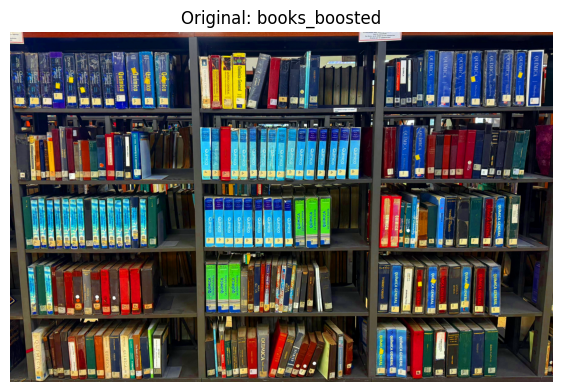

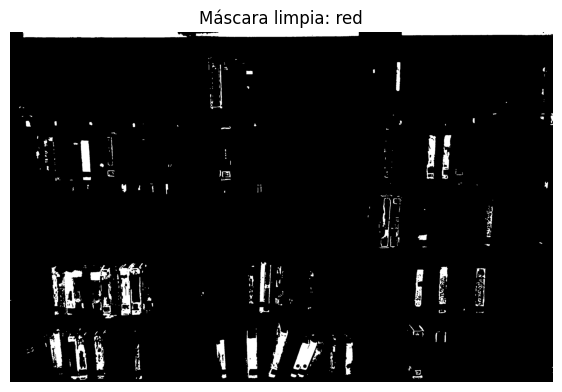

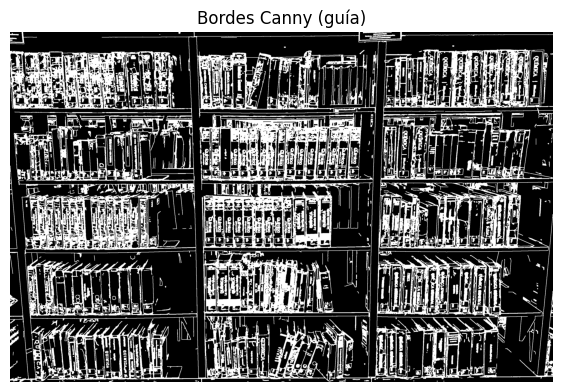

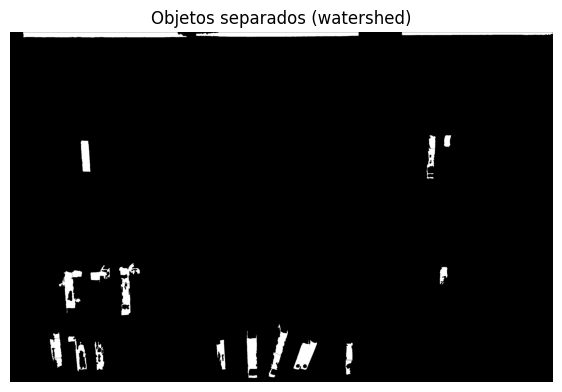

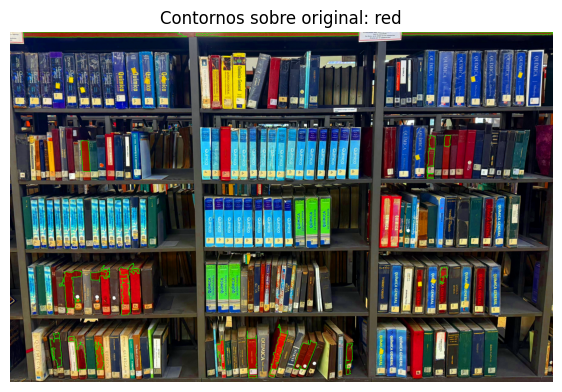

...

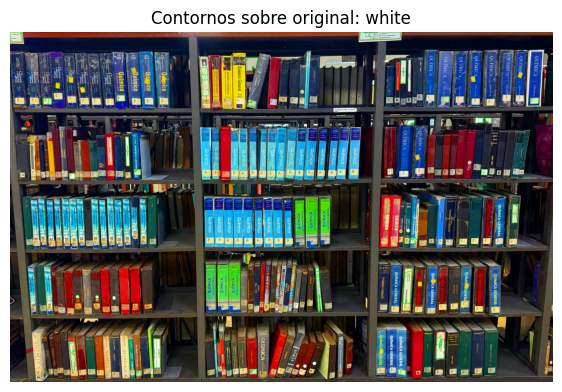

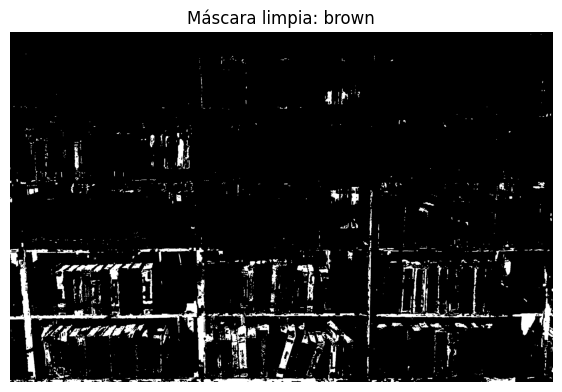

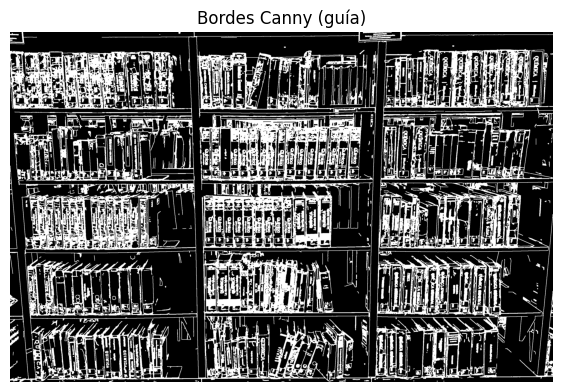

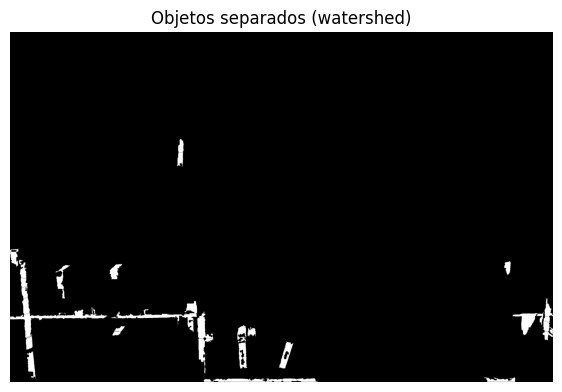

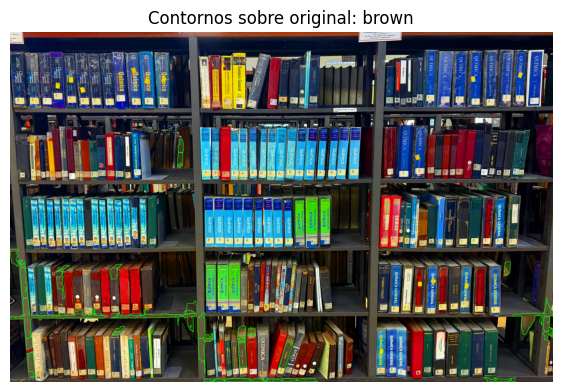

,image,scene,color,object_id,area_px
0,books_boosted.png,books_boosted,red,1,5887
1,books_boosted.png,books_boosted,red,2,6543
2,books_boosted.png,books_boosted,red,3,15853
3,books_boosted.png,books_boosted,red,4,6331
4,books_boosted.png,books_boosted,red,5,10753
...,...,...,...,...,...
172,books_boosted.png,books_boosted,brown,15,4149
173,books_boosted.png,books_boosted,brown,16,2417
174,books_boosted.png,books_boosted,brown,17,32787
175,books_boosted.png,books_boosted,brown,18,3979


,color,objetos,area_total
0,blue_dark,26,482172
1,blue_light,38,384828
2,brown,19,146950
3,green_dark,28,7319
4,green_fluo,5,87745
5,green_light,6,3522
6,red,18,220828
7,red2,6,130374
8,white,29,88741
9,yellow,2,45582


Se guardaron las máscaras y las tablas CSV en la carpeta 'output/'


In [14]:
# === Libros ===
SCENE = 'books_boosted'  # Fijamos la escena directamente

def find_one(patterns):
    for p in patterns:
        hits = sorted(glob.glob(p))
        if hits:
            return hits[0]
    return None

IMAGE_PATH = find_one([os.path.join(INPUT_DIR, 'books_boosted.*')])
assert IMAGE_PATH is not None, f'No encontré imagen para {SCENE}. Revisa carpeta input/'
print('Imagen:', IMAGE_PATH)

img = read_rgb(IMAGE_PATH)
plt.figure(figsize=(7,5))
plt.imshow(img)
plt.axis('off')
plt.title(f'Original: {SCENE}')
plt.show()

# === Procesamiento de colores ===
rows = []
masks = {}  # ⬅️ añadimos esto para guardar las máscaras por color

for color_name, (lo, hi) in HSV_RANGES[SCENE].items():
    mask = make_mask_hsv(img, *lo, *hi)
    mask_clean = morphology_clean(mask, ksize=3, open_it=1, close_it=1)
    mask_refined, edges = refine_with_edges(img, mask_clean, low=80, high=160)
    mask_split = split_touching_objects(mask_refined)
    contours, areas = contours_and_areas(mask_split)
    overlay = draw_contours_on(img, contours, color=(0,255,0))

    # Guardar la máscara limpia para exportar después
    masks[color_name] = mask_clean

    # Mostrar pasos intermedios (sin cambios)
    plt.figure(figsize=(7,5))
    plt.imshow(mask_clean, cmap='gray'); plt.axis('off'); plt.title(f'Máscara limpia: {color_name}')
    plt.show()

    plt.figure(figsize=(7,5))
    plt.imshow(edges, cmap='gray'); plt.axis('off'); plt.title('Bordes Canny (guía)')
    plt.show()

    plt.figure(figsize=(7,5))
    plt.imshow(mask_split, cmap='gray'); plt.axis('off'); plt.title('Objetos separados (watershed)')
    plt.show()

    plt.figure(figsize=(7,5))
    plt.imshow(overlay); plt.axis('off'); plt.title(f'Contornos sobre original: {color_name}')
    plt.show()

    # Guardar resultados en filas (una por objeto)
    for i, area in enumerate(areas, start=1):
        rows.append({
            'image': os.path.basename(IMAGE_PATH),
            'scene': SCENE,
            'color': color_name,
            'object_id': i,
            'area_px': int(area)
        })

# === Crear DataFrame con todas las detecciones ===
df_test = pd.DataFrame(rows)
display(df_test)

# === Agregar resumen de conteo por color ===
df_summary = (
    df_test.groupby('color', as_index=False)
           .agg(objetos=('object_id', 'count'),
                area_total=('area_px', 'sum'))
)
display(df_summary)

# === Guardar resultados ===
os.makedirs('output', exist_ok=True)

# Guardar máscaras
for color, mask in masks.items():
    cv2.imwrite(f'output/books_mask_{color}.png', mask)

# Guardar tabla de objetos individuales y resumen
df_test.to_csv('output/objetos_detalle.csv', index=False, encoding='utf-8-sig')
df_summary.to_csv('output/resumen_colores.csv', index=False, encoding='utf-8-sig')

print("Se guardaron las máscaras y las tablas CSV en la carpeta 'output/'")


#### Análisis de resultados obtenidos y oportunidades de mejora

La comparación entre las fotografías del escritorio (office) y la estantería de la biblioteca (books) permitió evaluar el comportamiento del algoritmo de segmentación bajo condiciones contrastantes. Para la fotografía office, la homogeneidad del fondo y la presencia de pocos objetos con colores uniformes y contornos bien diferenciados (verde-limón, blanco, gris oscuro y negro) facilitaron la calibración de umbrales en los espacios de color HSV y Lab, logrando una separación nítida entre los objetos y el entorno. No obstante, fue necesario un ajuste manual iterativo para resolver la confusión entre los tonos oscuros del negro y color madera del escritorio. 

Por el contrario, para la imagen compuesta por 168 libros, de diversos colores y distribuidos en varios estantes, fue más difícil de segmentar debido a su complejidad geométrica, la alta densidad de objetos y la similitud cromática entre los libros y la estantería. Las sombras, reflejos y variaciones de brillo generaron ruido y pérdida de precisión en los contornos, especialmente en colores oscuros como azul y marrón. Tras aplicar un realce de saturación (books_boosted) y filtros morfológicos, las máscaras mejoraron su capacidad de diferenciación, evidenciando que el contraste radiométrico es determinante para la segmentación por color (Gonzalez & Woods, 2018).

Asimismo, se constató que los colores próximos en tono pero distintos en luminancia tienden a solaparse en HSV, mientras que el espacio Lab ofrece una mejor discriminación perceptual. Las operaciones morfológicas de apertura y dilatación fueron esenciales para eliminar objetos y consolidar los bordes, en concordancia con Russ (2016).

Pese a las limitaciones, ambos casos validan la eficacia de combinar métricas perceptuales (HSV–Lab) con gradientes y operaciones morfológicas, tal como proponen Bradski y Kaehler (2008), demostrando la robustez del enfoque para escenarios sencillos (objetos separados, bien delimitados y de textura uniforme). Sin embargo, su rendimiento disminuye en escenas con estructuras repetitivas y variaciones tonales sutiles. Futuras mejoras podrían incluir la integración de algoritmos de aprendizaje no supervisado, como k-means o mean shift, que permitan adaptar automáticamente los umbrales y reducir la dependencia del ajuste manual (Bradski & Kaehler, 2008).

### Referencias
Bradski, G., & Kaehler, A. (2008). Learning OpenCV: Computer Vision with the OpenCV Library. O’Reilly Media.

Burger, W., & Burge, M. J. (2016). Digital Image Processing: An Algorithmic Introduction Using Java (2nd ed.). Springer.

Gonzalez, R. C., & Woods, R. E. (2018). Digital Image Processing (4th ed.). Pearson.

OpenCV Documentation. (2023). Image Processing in OpenCV. OpenCV. https://docs.opencv.org/

Pratt, W. K. (2007). Digital Image Processing: PIKS Scientific Inside (4th ed.). Wiley-Interscience.

Russ, J. C. (2016). The Image Processing Handbook (7th ed.). CRC Press.

Sonka, M., Hlavac, V., & Boyle, R. (2014). Image Processing, Analysis, and Machine Vision (4th ed.). Cengage Learning.

